## Dependencies

In [1]:
import math, PIL
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow.keras.backend as K
from kaggle_datasets import KaggleDatasets
from melanoma_utility_scripts import *

# Model parameters

In [2]:
config = {
  "HEIGHT": 384,
  "WIDTH": 384,
  "CHANNELS": 3,
  "AUGMENTED_SAMPLES": 5,
  "COLUMNS": 10,
  "SIZE": 160,
  "DATASET_PATH": 'melanoma-384x384'
}

config

{'HEIGHT': 384,
 'WIDTH': 384,
 'CHANNELS': 3,
 'AUGMENTED_SAMPLES': 5,
 'COLUMNS': 10,
 'SIZE': 160,
 'DATASET_PATH': 'melanoma-384x384'}

# Load data

In [3]:
database_base_path = '/kaggle/input/siim-isic-melanoma-classification/'
train = pd.read_csv(database_base_path + 'train.csv')

print('Train samples: %d' % len(train))
display(train.head())

GCS_PATH = KaggleDatasets().get_gcs_path(config['DATASET_PATH'])
TRAINING_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/train*.tfrec')
TRAINING_FILENAMES = TRAINING_FILENAMES[1] # sample

Train samples: 33126


,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0


# Augmentations

In [4]:
def data_augment(image):
    p_rotation = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_cutout = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_shear = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    
    if p_shear > .2:
        if p_shear > .6:
            image = transform_shear(image, config['HEIGHT'], shear=20.)
        else:
            image = transform_shear(image, config['HEIGHT'], shear=-20.)
    
    if p_rotation > .2:
        if p_rotation > .6:
            image = transform_rotation(image, config['HEIGHT'], rotation=45.)
        else:
            image = transform_rotation(image, config['HEIGHT'], rotation=-45.)

    if p_crop > .2:
        image = data_augment_crop(image)

    if p_rotate > .2:
        image = data_augment_rotate(image)
        
    image = data_augment_spatial(image)
    
    image = tf.image.random_saturation(image, 0.7, 1.3)
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_brightness(image, 0.1)
    
    if p_cutout > .5:
        image = data_augment_cutout(image)
    
    return image


def data_augment_tta(image):
    p_rotation = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    
    if p_rotation > .2:
        if p_rotation > .6:
            image = transform_rotation(image, config['HEIGHT'], rotation=45.)
        else:
            image = transform_rotation(image, config['HEIGHT'], rotation=-45.)

    if p_crop > .2:
        image = data_augment_crop(image)

    if p_rotate > .2:
        image = data_augment_rotate(image)
        
    image = data_augment_spatial(image)
    
    image = tf.image.random_saturation(image, 0.7, 1.3)
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_brightness(image, 0.1)
    
    return image


def data_augment_spatial(image):
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)

    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    if p_spatial > .75:
        image = tf.image.transpose(image)

    return image

def data_augment_rotate(image):
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    if p_rotate > .66:
        image = tf.image.rot90(image, k=3) # rotate 270º
    elif p_rotate > .33:
        image = tf.image.rot90(image, k=2) # rotate 180º
    else:
        image = tf.image.rot90(image, k=1) # rotate 90º

    return image

def data_augment_crop(image):
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    crop_size = tf.random.uniform([], int(config['HEIGHT']*.7), config['HEIGHT'], dtype=tf.int32)
    
    if p_crop > .5:
        image = tf.image.random_crop(image, size=[crop_size, crop_size, config['CHANNELS']])
    else:
        if p_crop > .4:
            image = tf.image.central_crop(image, central_fraction=.7)
        elif p_crop > .2:
            image = tf.image.central_crop(image, central_fraction=.8)
        else:
            image = tf.image.central_crop(image, central_fraction=.9)
    
    image = tf.image.resize(image, size=[config['HEIGHT'], config['WIDTH']])

    return image

def data_augment_cutout(image, min_mask_size=(int(config['HEIGHT'] * .1), int(config['HEIGHT'] * .1)), 
                        max_mask_size=(int(config['HEIGHT'] * .125), int(config['HEIGHT'] * .125))):
    p_cutout = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    if p_cutout > .85: # 10~15 cut outs
        n_cutout = tf.random.uniform([], 10, 15, dtype=tf.int32)
        image = random_cutout(image, config['HEIGHT'], config['WIDTH'], 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    elif p_cutout > .6: # 5~10 cut outs
        n_cutout = tf.random.uniform([], 5, 10, dtype=tf.int32)
        image = random_cutout(image, config['HEIGHT'], config['WIDTH'], 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    elif p_cutout > .25: # 2~5 cut outs
        n_cutout = tf.random.uniform([], 2, 5, dtype=tf.int32)
        image = random_cutout(image, config['HEIGHT'], config['WIDTH'], 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=n_cutout)
    else: # 1 cut out
        image = random_cutout(image, config['HEIGHT'], config['WIDTH'], 
                              min_mask_size=min_mask_size, max_mask_size=max_mask_size, k=1)

    return image

## Auxiliary functions

In [5]:
# Datasets utility functions
LABELED_TFREC_FORMAT = {
    "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
    "target": tf.io.FixedLenFeature([], tf.int64), # shape [] means single element
}

def decode_image(image_data, height, width, channels):
    image = tf.image.decode_jpeg(image_data, channels=channels)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.reshape(image, [height, width, channels])
    return image

def read_labeled_tfrecord_eval(example, height=config['HEIGHT'], width=config['WIDTH'], channels=config['CHANNELS']):
    example = tf.io.parse_single_example(example, LABELED_TFREC_FORMAT)
    image = decode_image(example['image'], height, width, channels)
    label = tf.cast(example['target'], tf.float32)
    
    return image

def load_dataset(filenames, ordered=False):
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed

    dataset = tf.data.TFRecordDataset(filenames) # automatically interleaves reads from multiple files
    dataset = dataset.with_options(ignore_order) # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(read_labeled_tfrecord)
    
    return dataset # returns a dataset of (image, data, label)

def load_dataset_display(filenames):
    dataset = tf.data.TFRecordDataset(filenames) # automatically interleaves reads from multiple files
    dataset = dataset.map(read_labeled_tfrecord_eval,)
    
    return dataset # returns a dataset of (image, data, label, image_name)

def get_display_dataset(filenames, batch_size=32):
    dataset = load_dataset_display(filenames)
    dataset = dataset.batch(batch_size, drop_remainder=False)
    return dataset

def display_augmentation(dataset, n_samples, augmentation, rows=1, cols=8):
    dataset_elements = iter(dataset)
    for sample in range(n_samples):
        element = tf.data.Dataset.from_tensors(next(dataset_elements))
        element_augmented = element.repeat().map(augmentation).batch(rows*cols)
        for img in element_augmented:
            plt.figure(figsize=(15, int(15*rows/cols)))
            for j in range(rows*cols):
                plt.subplot(rows, cols, j+1)
                plt.axis('off')
                plt.imshow(img[j,])
            plt.show()
            break
            
def show_dataset(thumb_size, cols, rows, ds):
    mosaic = PIL.Image.new(mode='RGB', size=(thumb_size*cols + (cols-1), 
                                             thumb_size*rows + (rows-1)))
    for idx, data in enumerate(ds):
        img = data
        ix  = idx % cols
        iy  = idx // cols
        img = np.clip(img.numpy() * 255, 0, 255).astype(np.uint8)
        img = PIL.Image.fromarray(img)
        img = img.resize((thumb_size, thumb_size), resample=PIL.Image.BILINEAR)
        mosaic.paste(img, (ix*thumb_size + ix, 
                           iy*thumb_size + iy))

    display(mosaic)

# Display images

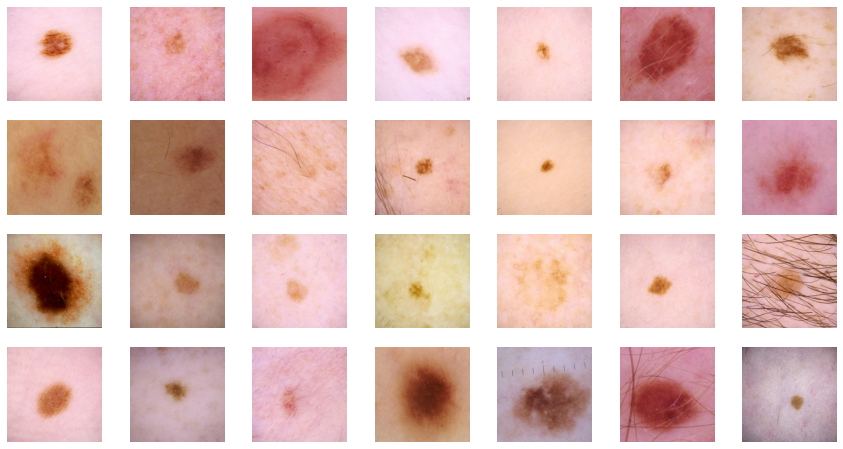

In [6]:
row = 4; col = 7;
all_elements = get_display_dataset(TRAINING_FILENAMES).unbatch()
batch_element = all_elements.repeat().batch(row*col)

for img in batch_element:
    plt.figure(figsize=(15, int(15*row/col)))
    for j in range(row*col):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

# Spatial augmentation

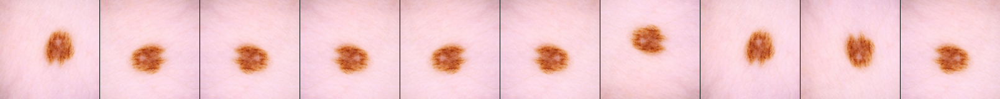

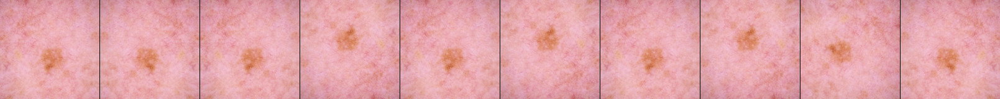

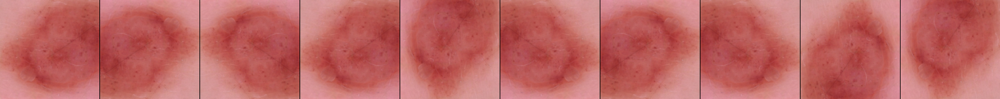

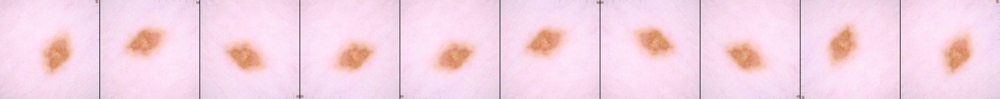

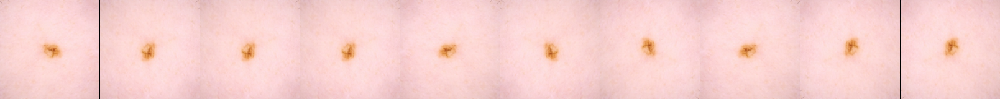

In [7]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (data_augment_spatial(img)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# Rotates augmentation

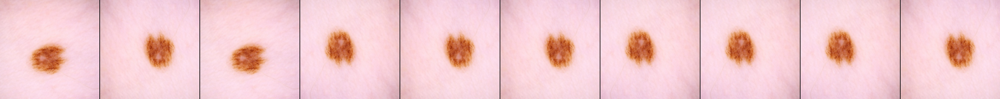

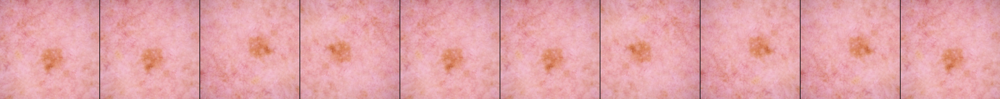

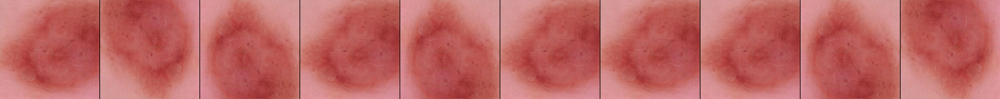

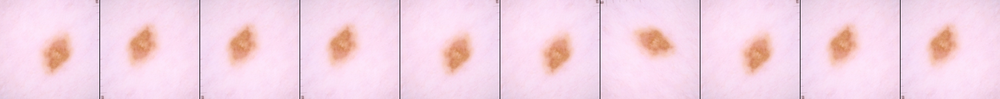

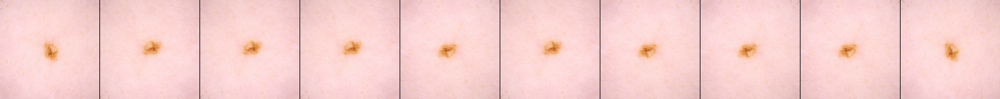

In [8]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (data_augment_rotate(img)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# Crop augmentation

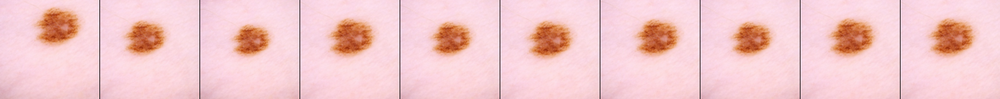

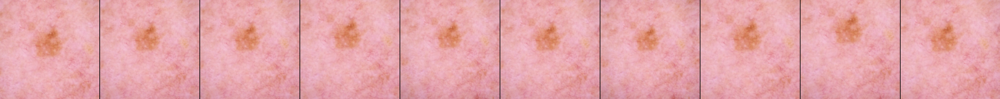

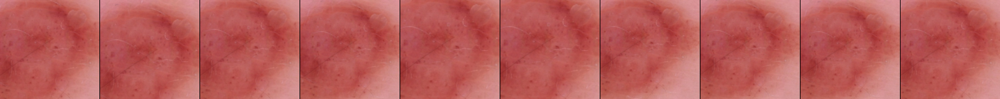

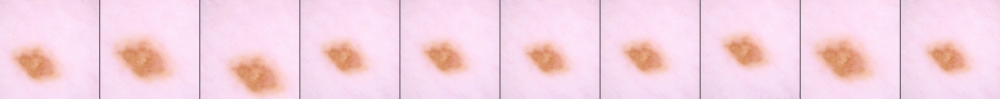

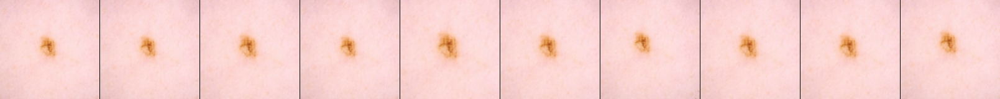

In [9]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (data_augment_crop(img)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# Rotation augmentation

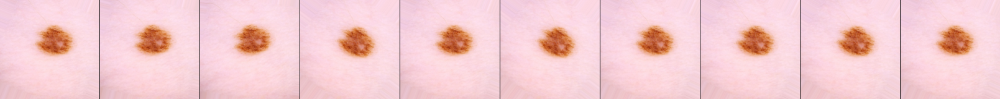

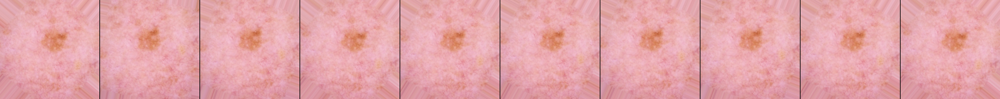

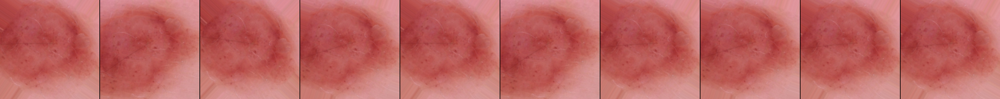

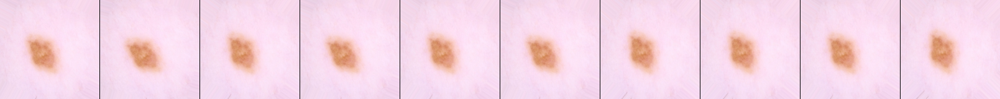

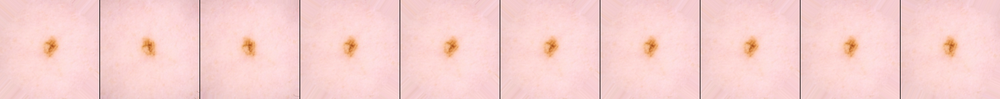

In [10]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (transform_rotation(img, config['HEIGHT'], rotation=45.)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# Shear augmentation

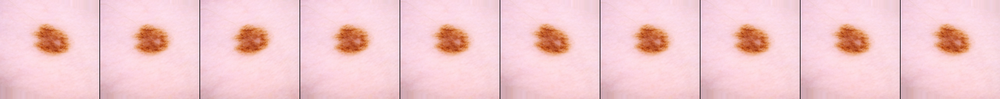

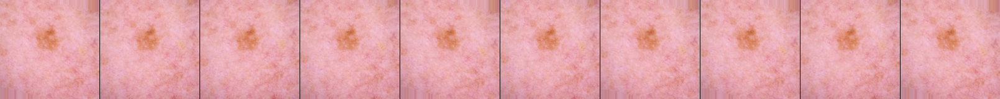

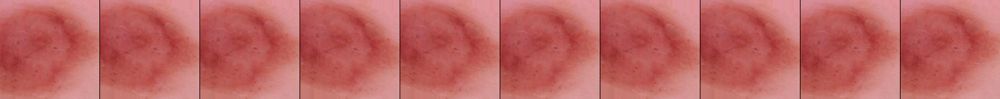

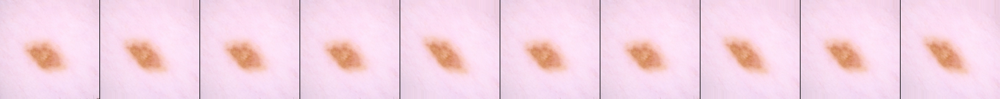

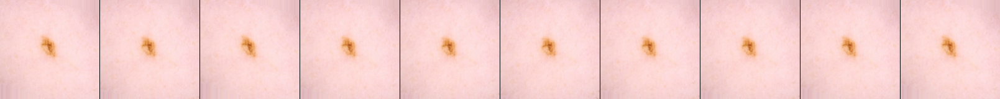

In [11]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (transform_shear(img, config['HEIGHT'], shear=20.)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# Saturation augmentation

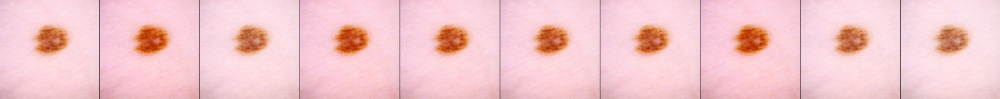

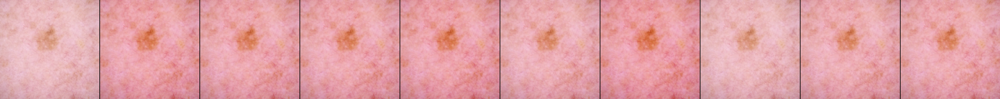

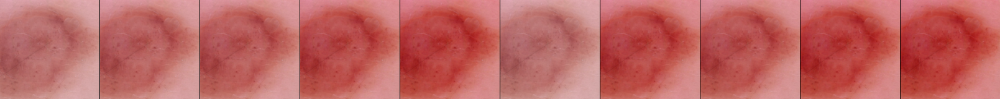

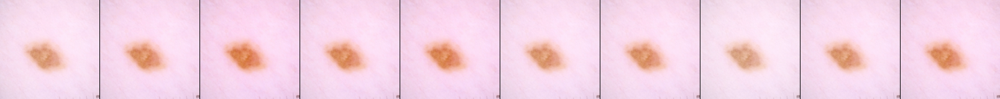

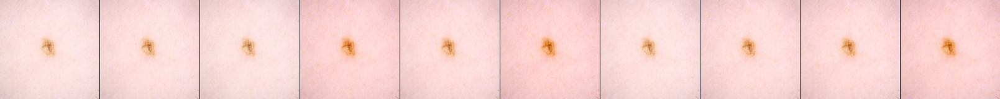

In [12]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (tf.image.random_saturation(img, 0.7, 1.3)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# Contrast augmentation

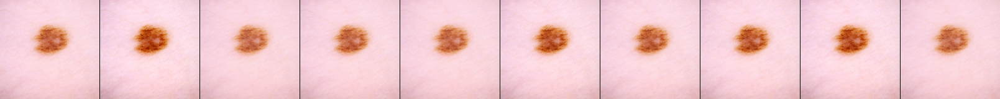

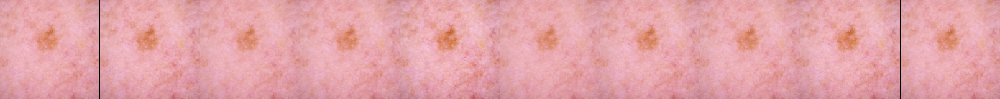

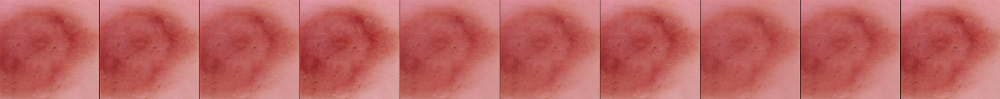

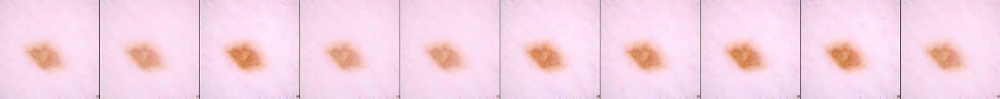

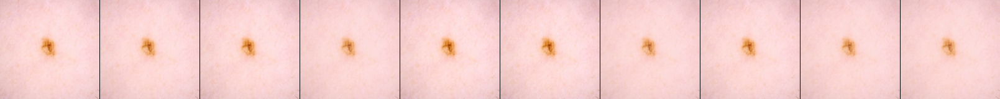

In [13]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (tf.image.random_contrast(img, 0.8, 1.2)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# Brightness augmentation

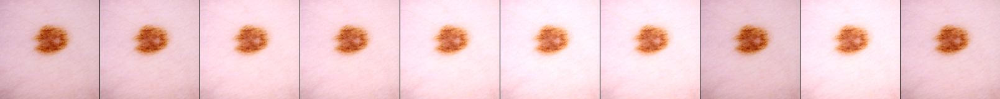

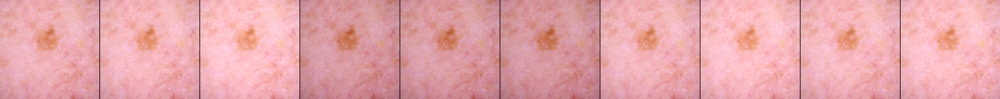

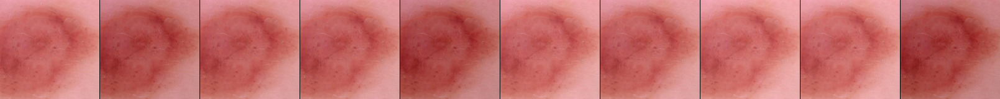

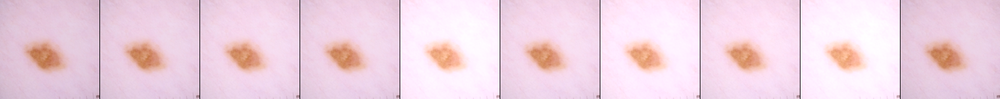

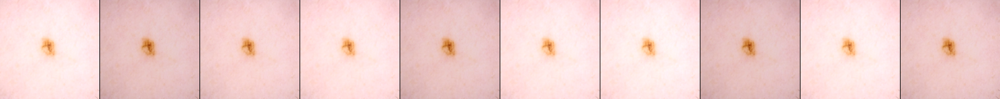

In [14]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (tf.image.random_brightness(img, 0.1)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# Cutout augmentation

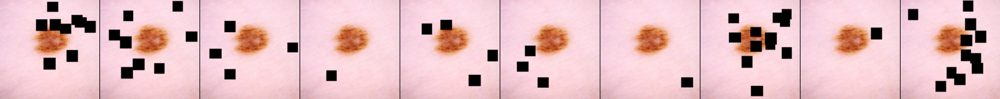

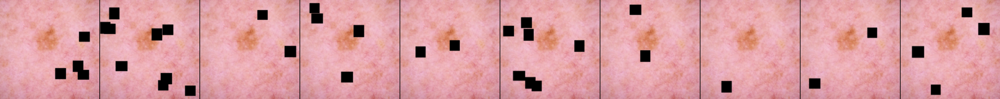

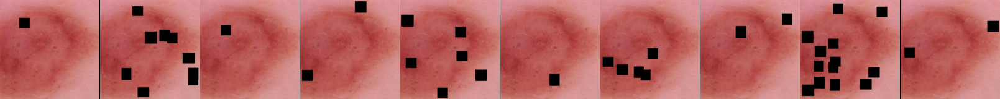

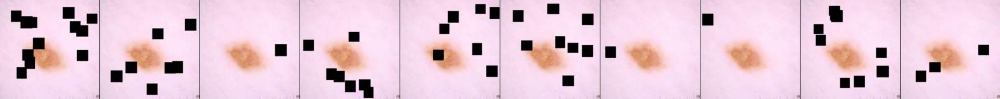

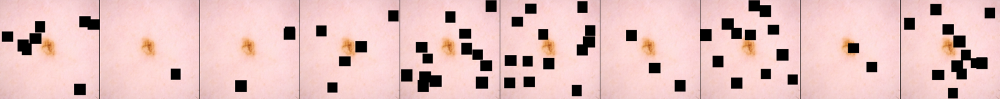

In [15]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(config['AUGMENTED_SAMPLES']):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    ds = element.take(1).repeat().map(lambda img: (data_augment_cutout(img)))
    ds = ds.take(config['COLUMNS'])
    show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# All augmentations

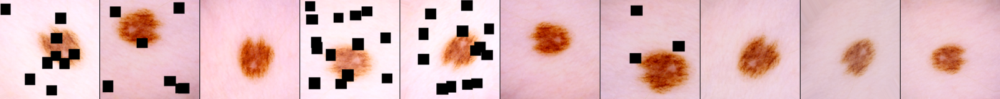

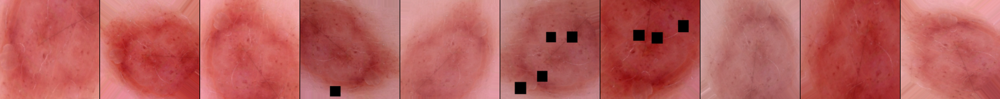

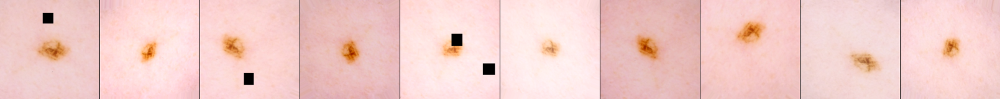

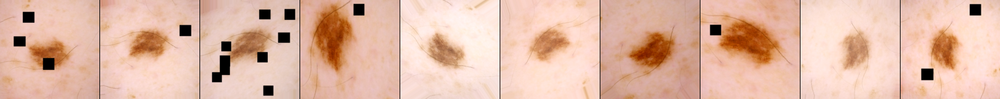

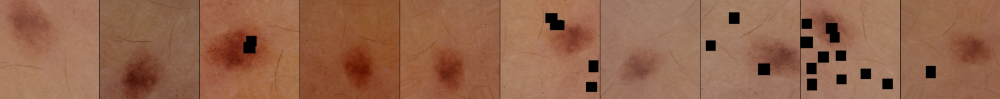

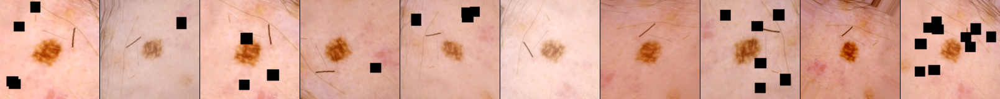

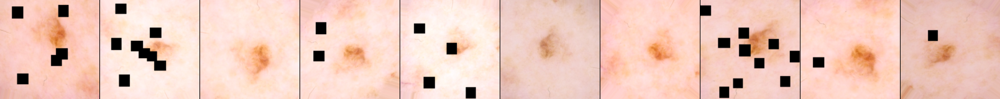

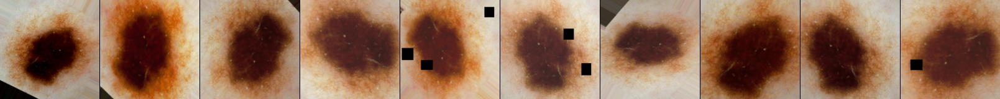

In [16]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(16):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    if sample % 2 == 0:
        ds = element.take(1).repeat().map(lambda img: (data_augment(img)))
        ds = ds.take(config['COLUMNS'])
        show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)

# All augmentations (TTA)

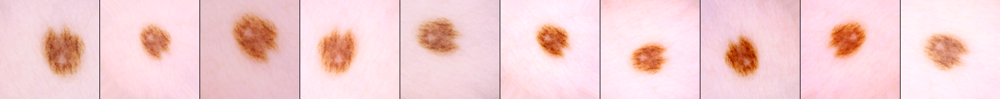

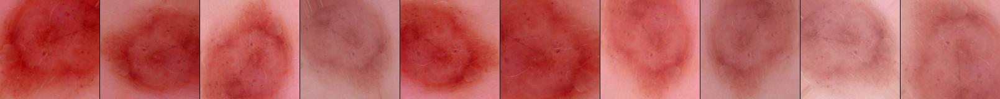

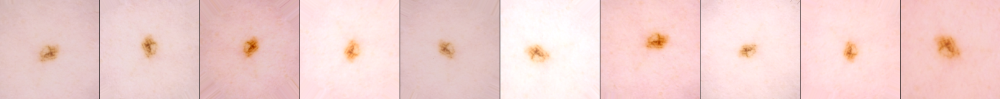

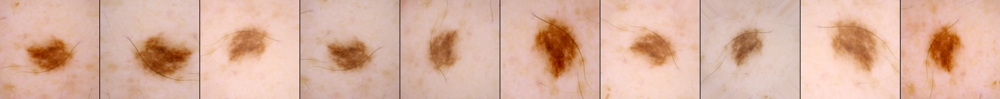

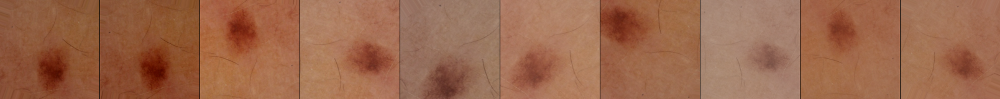

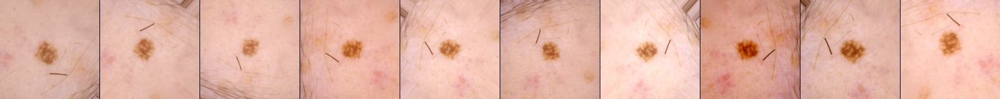

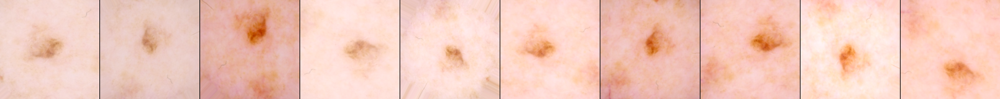

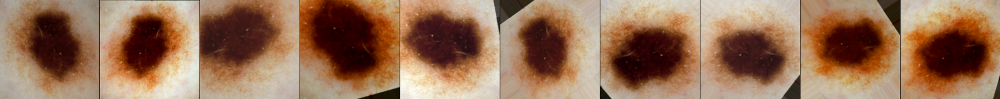

In [17]:
all_elements = iter(get_display_dataset(TRAINING_FILENAMES).unbatch())
for sample in range(16):
    element = tf.data.Dataset.from_tensors(next(all_elements))
    if sample % 2 == 0:
        ds = element.take(1).repeat().map(lambda img: (data_augment_tta(img)))
        ds = ds.take(config['COLUMNS'])
        show_dataset(config['SIZE'], config['COLUMNS'], 1, ds)